## Analysis

In [1]:
import pandas as pd
from ast import literal_eval
import seaborn as sns
import matplotlib as plt
import re

In [2]:
df = pd.read_csv('data_v1/wiki-dataset-results-1k.csv')

In [3]:
# all columns with objects stored as strings have to be evaluated back to objects
objectTypeCols = [
    'sentences',
    'paraphrased_sentences',
    'normal_entities',
    'paraphrased_entities',
    'normal_predictions',
    'paraphrased_predictions',
    'normal_prediction_tokens',
    'paraphrased_prediction_tokens'
    ]

for col in objectTypeCols:
    df[col] = df[col].apply(lambda cell: literal_eval(cell))

In [4]:
# convert numpy number types to native python for processing
# with autoviz
df['normal_scores'] = df['normal_scores'].apply(lambda cell: int(cell))
df['paraphrased_scores'] = df['paraphrased_scores'].apply(lambda cell: int(cell)) #.item())

In [5]:
df.shape

(944, 18)

In [6]:
# text lengths after preprocessing
df['normal_text_length'] = df['normal_text'].apply(lambda text: len(text))
df['paraphrased_text_length'] = df['paraphrased_text'].apply(lambda text: len(text))

In [7]:
# number of sentences in each wiki page after preprocessing
# sentences were used for paraphrasing. Later joined back together for NER and fill-mask
df['normal_sentences_count'] = df['sentences'].apply(lambda array: len(array))
df['paraphrased_sentences_count'] = df['paraphrased_sentences'].apply(lambda array: len(array))

In [8]:
# number of masks present in text ready for processing
df['normal_mask_count'] = df['normal_masked_text'].apply(lambda text: len([*re.finditer('<mask>', text)]))
df['paraphrased_mask_count'] = df['paraphrased_masked_text'].apply(lambda text: len([*re.finditer('<mask>', text)]))

In [9]:
# count of entities detected by NER, where masking can be applied (entities which
# are not the person the wiki page is about are filtered out)
df['normal_entities_count'] = df['normal_entities'].apply(lambda arr: len(arr))
df['paraphrased_entities_count'] = df['paraphrased_entities'].apply(lambda arr: len(arr))

In [10]:
# top 20 scorer numbers of different metrics compared by paraphrased or not
# TODO

In [11]:
# worst 20 scorer numbers of different metrics compared by paraphrased or not
# TODO

In [12]:
# compare average of trimmed characters by paraphrasing
# TODO

## analysis of average scorings

In [13]:
# average numbers of different metrics compared by paraphrased or not
# CAREFUL: this excludes examples which were lost during computation (due to NER not detecting any entities)
print("NORMAL Average masks count per page: {}".format(round(df['normal_entities_count'].mean(),2)))
print("PARAPH Average masks count per page: {}".format(round(df['paraphrased_entities_count'].mean(),2)))
print("")
print("NORMAL Average score per page: {}".format(round(df['normal_scores'].mean(),2)))
print("PARAPH Average score per page: {}".format(round(df['paraphrased_scores'].mean(),2)))
print("")
print("NORMAL Average text length: {}".format(round(df['normal_text_length'].mean(),2)))
print("PARAPH Average text length: {}".format(round(df['paraphrased_text_length'].mean(),2)))

NORMAL Average masks count per page: 6.37
PARAPH Average masks count per page: 5.27

NORMAL Average score per page: 17.62
PARAPH Average score per page: 15.42

NORMAL Average text length: 3451.22
PARAPH Average text length: 2345.54


## analysis of bad scores
- N: normal
- P: paraphrased

In [14]:
# how many rows did not have any masks to predict and therefore no predictions?
Nzero = len(df.loc[df['normal_entities_count'] == 0])
Pzero = len(df.loc[df['paraphrased_entities_count'] == 0])

print("NORMAL {}/{} ({}%) did not have any masks to predict".format(Nzero, df.shape[0], round(100 / df.shape[0] * Nzero,2)))
print("PARAPH {}/{} ({}%) did not have any masks to predict".format(Pzero, df.shape[0], round(100 / df.shape[0] * Pzero,2)))

NORMAL 16/944 (1.69%) did not have any masks to predict
PARAPH 50/944 (5.3%) did not have any masks to predict


In [15]:
# how many rows did not correctly predict any mask at all? (without those that had no masks to predict)
NzeroPredictedEntitiesRows = df.loc[(df['normal_scores'] == 0) & (df['normal_entities_count'] > 0)]
PzeroPredictedEntitiesRows = df.loc[(df['paraphrased_scores'] == 0) & (df['normal_entities_count'] > 0)]
NCount = len(NzeroPredictedEntitiesRows)
PCount = len(PzeroPredictedEntitiesRows)
Npercent = round(100 / df.shape[0] * NCount, 2)
Ppercent = round(100 / df.shape[0] * PCount, 2)
print("NORMAL No mask correctly predicted for {}/{} pages ({}%)".format(NCount, df.shape[0], Npercent))
print("PARAPH No mask correctly predicted for {}/{} pages ({}%)".format(PCount, df.shape[0], Ppercent))

NORMAL No mask correctly predicted for 369/944 pages (39.09%)
PARAPH No mask correctly predicted for 524/944 pages (55.51%)


In [16]:
# what was the average text length for those which did not contain a single entity?
NzeroPredictedEntitiesRows = df.loc[(df['normal_scores'] == 0) & (df['normal_entities_count'] > 0)]
PzeroPredictedEntitiesRows = df.loc[(df['paraphrased_scores'] == 0) & (df['normal_entities_count'] > 0)]
print("NORMAL average text length for 0 score: {} chars".format(round(NzeroPredictedEntitiesRows['normal_text_length'].mean(),2)))
print("PARAPH average text length for 0 score: {} chars".format(round(PzeroPredictedEntitiesRows['normal_text_length'].mean(),2)))

NORMAL average text length for 0 score: 3251.49 chars
PARAPH average text length for 0 score: 3349.48 chars


## Basic graphs

(0.0, 4100.0)

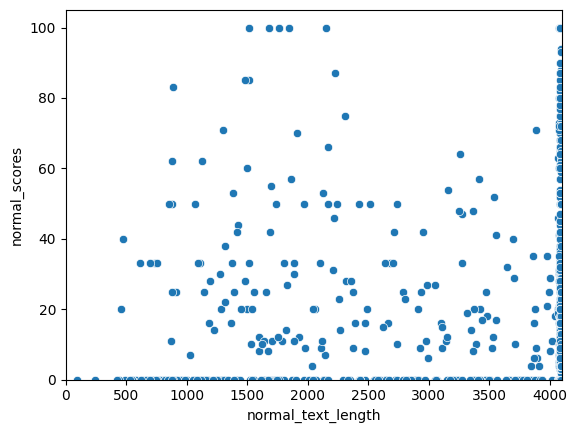

In [17]:
# compare score to text length
# fig, ax = plt.subplots()
gf = sns.scatterplot(data=df, x='normal_text_length', y='normal_scores')
gf.set_ylim(0, 105)
gf.set_xlim(0, 4100)
# Graph is cut at 4k characters, as we cut text-lengths there to have enough text for processing.
# text was cut after the first 4k, as most information is within the first few characters

In [135]:
## Normal Text
## How many % of pages scores > 0 for different page-lengths?
above4k = df.loc[(df['normal_text_length'] >= 4000)]
above4kScores = above4k.loc[above4k['normal_scores'] > 0]
below4k = df.loc[(df['normal_text_length'] < 4000)]
below4kScores = below4k.loc[below4k['normal_scores'] > 0]
with34k = df.loc[(df['normal_text_length'] >= 2000) & (df['normal_text_length'] < 3000)]
with34kScores = with34k.loc[with34k['normal_scores'] > 0]

print(with34kScores.shape)

print("NORMAL TEXT")
args1 = (round(100 / above4k.shape[0] * above4kScores.shape[0], 2), above4kScores.shape[0], above4k.shape[0])
args2 = (round(100 / below4k.shape[0] * below4kScores.shape[0], 2), below4kScores.shape[0], below4k.shape[0])
args3 = (round(100 / with34k.shape[0] * with34kScores.shape[0], 2), with34kScores.shape[0], with34k.shape[0])
print("Texts with score > 0% with >=4k text: {}% ({}/{} pages)".format(*args1))
print("Texts with score > 0% with < 4k text: {}% ({}/{} pages)".format(*args2))
print("Texts with score > 0% with 2-3k text: {}% ({}/{} pages)".format(*args3))

print()

## Paraphrased Text
above4k = df.loc[(df['paraphrased_text_length'] >= 4000)]
above4kScores = above4k.loc[above4k['paraphrased_scores'] > 0]
below4k = df.loc[(df['paraphrased_text_length'] < 4000)]
below4kScores = below4k.loc[below4k['paraphrased_scores'] > 0]
with34k = df.loc[(df['paraphrased_text_length'] >= 2000) & (df['paraphrased_text_length'] < 3000)]
with34kScores = with34k.loc[with34k['paraphrased_scores'] > 0]

print("PARAPHRASED TEXT")
args1 = (round(100 / above4k.shape[0] * above4kScores.shape[0], 2), above4kScores.shape[0], above4k.shape[0])
args2 = (round(100 / below4k.shape[0] * below4kScores.shape[0], 2), below4kScores.shape[0], below4k.shape[0])
args3 = (round(100 / with34k.shape[0] * with34kScores.shape[0], 2), with34kScores.shape[0], with34k.shape[0])
print("Texts with score > 0% with >=3.9k text: {}% ({}/{} pages)".format(*args1))
print("Texts with score > 0% with < 3.9k text: {}% ({}/{} pages)".format(*args2))
print("Texts with score > 0% with 2-3k text: {}% ({}/{} pages)".format(*args3))

(45, 26)
NORMAL TEXT
Texts with score > 0% with >=4k text: 63.75% (401/629 pages)
Texts with score > 0% with < 4k text: 50.16% (158/315 pages)
Texts with score > 0% with 2-3k text: 56.25% (45/80 pages)

PARAPHRASED TEXT
Texts with score > 0% with >=3.9k text: 42.86% (3/7 pages)
Texts with score > 0% with < 3.9k text: 42.9% (402/937 pages)
Texts with score > 0% with 2-3k text: 47.31% (237/501 pages)


## Interpretation
Normal text performs better with longer texts, while paraphrasing beforms similar in longest text and shortened texts. This means paraphrasing shortens texts, but is still capable of demasking them. Performance degrades for paraphrasing compared to normal text, but paraphrasing can deliver similar results for texts which are not shortend compared to texts which are paraphrased by about a quarter.

In [ ]:
# score depending on text length above or below 4k characters
above4k = df.loc[(df['normal_text_length'] >= 3900)]
below4k = df.loc[(df['normal_text_length'] < 3900)]
sns.displot(above4k.normal_scores)
sns.displot(below4k.normal_scores)
# score depending on text length above or below 4k characters
above4k = df.loc[(df['paraphrased_text_length'] >= 3900)]
below4k = df.loc[(df['paraphrased_text_length'] < 3900)]
sns.displot(above4k.normal_scores)
sns.displot(below4k.normal_scores)

In [ ]:
# text length distributions
sns.displot([df.normal_text_length, df.paraphrased_text_length], multiple='dodge')

### comparing mask counts to text and sentences length
We can see in the first figure below that paraphrasing shortened texts by about 1 fourth of their initial lengths, but did not reduce the amount of masks present after paraphrasing when compared to remaining text length. The mask count to text length proportion is very similar between paraphrasing and normal texts, only the overall mask count is different.

Comparing mask count by sentences however, we see that sentences do have less occurences of masks when paraphrased.
Therefore, paraphrasing does not necessarily remove masks compared to the overall text length, but it is likely to remove masks in sentences when it shortens them.

###### important points
- Paraphrasing regulary removes entities within sentences when shortening them
- Paraphrasing shortens texts, even when paraphrasing single sentences

###### Action Items
- [ ] Can we customize paraphrasing to rather keep entities within a sentences? Or delete less of the sentence and just rearrange it?

Text(0.5, 1.0, 'mask count compared by sentences count')

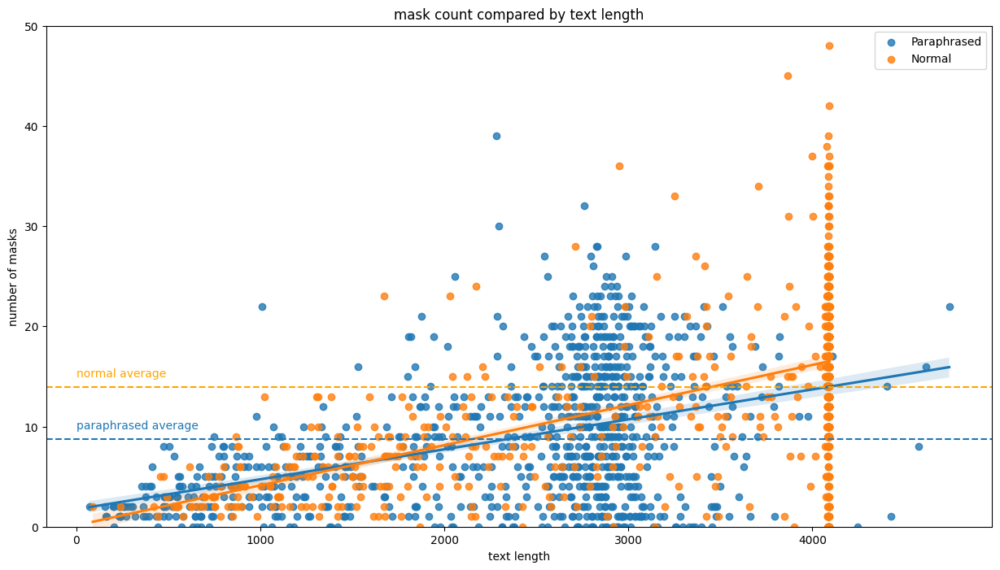

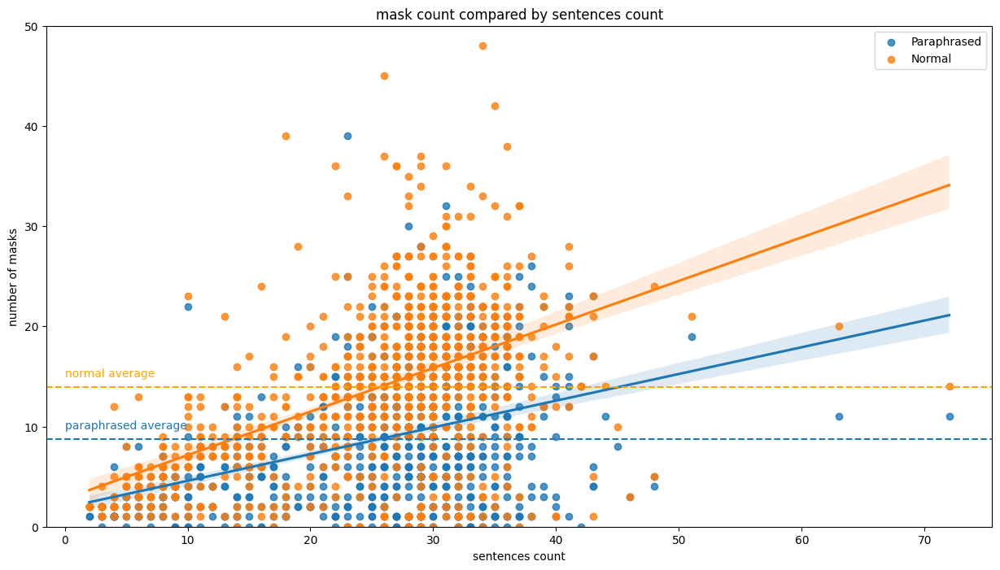

In [19]:
## Compare length of text to number of masks
plt.pyplot.figure(figsize=(15,8))
nf = sns.regplot(x=df['paraphrased_text_length'], y=df['paraphrased_mask_count'], label='Paraphrased')
nf = sns.regplot(x=df['normal_text_length'], y=df['normal_mask_count'], label='Normal')
nf.set_ylim(0, 50)
# nf.set_xlim(4000)
nf.axhline(df['normal_mask_count'].mean(), ls='--', c='orange')
nf.axhline(df['paraphrased_mask_count'].mean(), ls='--')
nf.set(xlabel='text length')
nf.set(ylabel='number of masks')
nf.text(0, df['paraphrased_mask_count'].mean()+1, "paraphrased average", c='C0')
nf.text(0, df['normal_mask_count'].mean()+1, "normal average", c='orange')
nf.legend()
nf.set_title("mask count compared by text length")

## Compare sentences count to number of masks
## Compare length of text to number of masks
plt.pyplot.figure(figsize=(15,8))
nf = sns.regplot(x=df['paraphrased_sentences_count'], y=df['paraphrased_mask_count'], label='Paraphrased')
nf = sns.regplot(x=df['normal_sentences_count'], y=df['normal_mask_count'], label='Normal')
nf.set_ylim(0, 50)
# nf.set_xlim(4000)
nf.axhline(df['normal_mask_count'].mean(), ls='--', c='orange')
nf.axhline(df['paraphrased_mask_count'].mean(), ls='--')
nf.set(xlabel='sentences count')
nf.set(ylabel='number of masks')
nf.text(0, df['paraphrased_mask_count'].mean()+1, "paraphrased average", c='C0')
nf.text(0, df['normal_mask_count'].mean()+1, "normal average", c='orange')
nf.legend()
nf.set_title("mask count compared by sentences count")

Text(0.5, 1.0, 'mask count compared by text length')

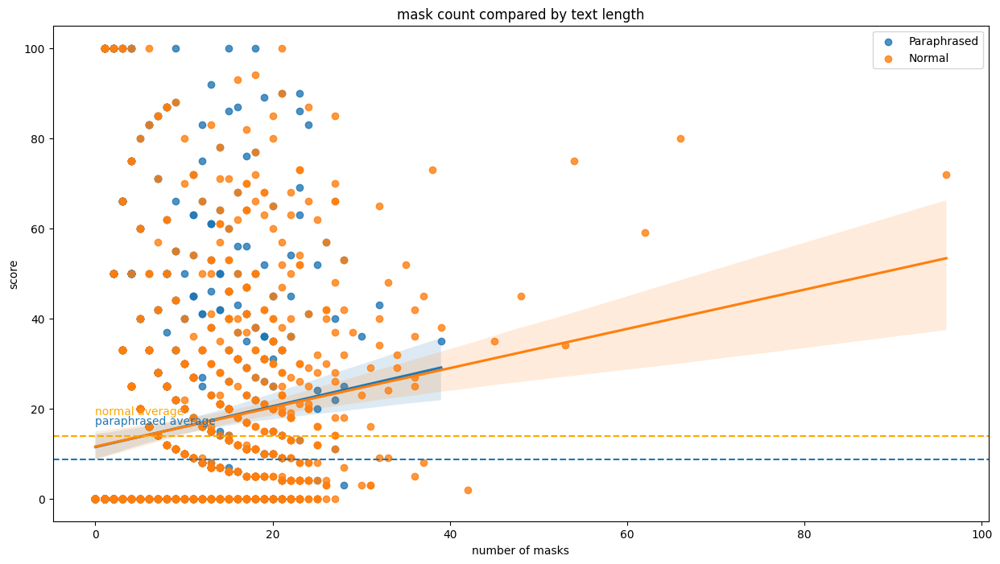

In [20]:
# compare number of masks to scores
## Compare length of text to number of masks
plt.pyplot.figure(figsize=(15,8))
nf = sns.regplot(x=df['paraphrased_mask_count'], y=df['paraphrased_scores'], label='Paraphrased')
nf = sns.regplot(x=df['normal_mask_count'], y=df['normal_scores'], label='Normal')
# nf.set_ylim(0, 50)
# nf.set_xlim(50)
nf.axhline(df['normal_mask_count'].mean(), ls='--', c='orange')
nf.axhline(df['paraphrased_mask_count'].mean(), ls='--')
nf.set(xlabel='number of masks')
nf.set(ylabel='score')
nf.text(0, df['paraphrased_scores'].mean()+1, "paraphrased average", c='C0')
nf.text(0, df['normal_scores'].mean()+1, "normal average", c='orange')
nf.legend()
nf.set_title("mask count compared by text length")


## Difference in number of masks vs entities
If everything went right, the number of masks should equal the number of entities detected by NER (filtered by name). However on average there are 7.5 more masks than detected entities (see below). This means strings were replaced with masks without being marked by NER.

Averages of:
number of entities: 6.37
number of masks: 13.95
difference masks - entities: 7.58


Text(0.5, 1.0, 'mask count compared by number of detected entities')

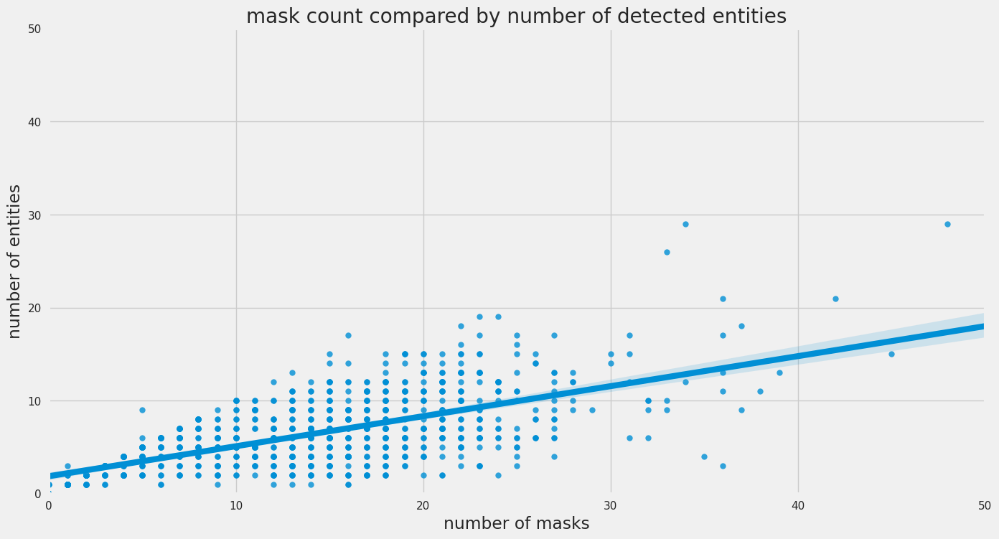

In [119]:
avg = round(df[['normal_mask_count', 'normal_entities_count']].apply(lambda row: row['normal_mask_count'] - row['normal_entities_count'], axis=1).mean(),2)
print("Averages of:")
print("number of entities: {}".format(round(df['normal_entities_count'].mean(),2)))
print("number of masks: {}".format(round(df['normal_mask_count'].mean(),2)))
print("difference masks - entities: {}".format(avg))

plt.pyplot.figure(figsize=(15,8))
nf = sns.regplot(x=df['normal_mask_count'], y=df['normal_entities_count'], label='Paraphrased')
nf.set_ylim(0, 50)
nf.set_xlim(0, 50)
nf.set(xlabel='number of masks')
nf.set(ylabel='number of entities')
nf.set_title("mask count compared by number of detected entities")

In [23]:
df[['normal_mask_count', 'normal_entities_count']].head()

,normal_mask_count,normal_entities_count
0,14,6
1,18,11
2,14,4
3,27,13
4,1,1


#### Why is the difference so big?
Turns out, the input to the AutoTokenizer for bert-base-NER silently fails to process the full input string when it is out of tokens (max 512). This results in much less entities being detected, as visualized below. The tokenizer only gives a hint to stdout, but its not logged or throws an error.

In [131]:
# set text to third wiki page
text = df.iloc[3]['normal_text']

from transformers import AutoTokenizer, AutoModelForTokenClassification
from transformers import pipeline
# load model and tokenizer
tokenizer = AutoTokenizer.from_pretrained("dslim/bert-base-NER")
model = AutoModelForTokenClassification.from_pretrained("dslim/bert-base-NER")
ner = pipeline("ner", model=model, tokenizer=tokenizer)

# apply NER to the wiki page
ner_results = ner(text)

# parse results to entities and indexes of entities
person_nr = -1
entities = []
indexes = []
for entity in ner_results:
    tag = entity['entity']
    if 'PER' in tag:  # if it is a person
        if ('B' in tag or 'I' in tag) and '#' not in entity['word']:
            person_nr += 1  # we came to the next person
            entities.append(entity['word'].strip())
            indexes.append([entity['start'], entity['end']])
        else:
            if person_nr < 0:
                continue
            if '#' in entity['word']:
                entities[person_nr] += entity['word'].strip().strip('#')
                indexes[person_nr][1] = entity['end']
            else:
                entities[person_nr] += ' ' + entity['word']
                indexes.append([entity['start'], entity['end']])

# color results
prev = 0
for start, end in indexes:
    print(text[prev:start], end='')
    print("\x1b[31m\"" + text[start:end] + "\"\x1b[0m", end='')
    prev = end
print(text[prev:])

"Plato" ( ;  ; 428/427 or 424/423 – 348/347 BC) was a Greek philosopher born in Athens during the Classical period in Ancient Greece, founder of the Platonist school of thought and the Academy, the first institution of higher learning in the Western world. He is widely considered a pivotal figure in the history of Ancient Greek and Western philosophy, along with his teacher, "Socrates", and his most famous student, "Aristotle". "Plato" has also often been cited as one of the founders of Western religion and spirituality. The so-called neoplatonism of philosophers such as "Plotinus" and "Po"rphyry greatly influenced Christianity through Church Fathers such as "Augustine". "Alfred" "North" "Whitehead" once noted: "the safest general characterization of the European philosophical tradition is that it consists of a series of footnotes to "Plato"." "Plato" was an innovator of the written dialogue and dialectic forms in philosophy. "Plato" is also considered the founder of Western political 

## metric flooding
Compare all and any variable in the dataset to get a quick overview on which results might be interesting to compare or look at in more detail. Results are stored separately, commented and easier to read than within the notebook.

In [27]:
%matplotlib inline
from autoviz.AutoViz_Class import AutoViz_Class

AV = AutoViz_Class()

Imported v0.1.55. After importing, execute '%matplotlib inline' to display charts in Jupyter.
    AV = AutoViz_Class()
    dfte = AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=1, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)
Update: verbose=0 displays charts in your local Jupyter notebook.
        verbose=1 additionally provides EDA data cleaning suggestions. It also displays charts.
        verbose=2 does not display charts but saves them in AutoViz_Plots folder in local machine.
        chart_format='bokeh' displays charts in your local Jupyter notebook.
        chart_format='server' displays charts in your browser: one tab for each chart type
        chart_format='html' silently saves interactive HTML files in your local machine


Shape of your Data Set loaded: (944, 26)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
    Number of Numeric Columns =  0
    Number of Integer-Categorical Columns =  10
    Number of String-Categorical Columns =  6
    Number of Factor-Categorical Columns =  0
    Number of String-Boolean Columns =  0
    Number of Numeric-Boolean Columns =  0
    Number of Discrete String Columns =  0
    Number of NLP String Columns =  6
    Number of Date Time Columns =  0
    Number of ID Columns =  4
    Number of Columns to Delete =  0
    26 Predictors classified...
        4 variables removed since they were ID or low-information variables
Number of All Scatter Plots = 55


KeyboardInterrupt: 

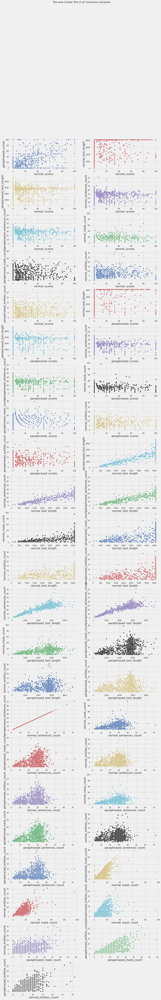

In [28]:
%matplotlib inline
filename = ""
sep = ","
dft = AV.AutoViz(
    filename="",
    depVar="",
    dfte=df,
    header=0,
    verbose=0,
    lowess=False,
    chart_format="svg",
    max_rows_analyzed=150000,
    max_cols_analyzed=30,
    save_plot_dir=None
)